In [46]:
# import required libraries
import os
import sys
### add system path to get other library directories
sys.path[0] = os.path.join(os.path.abspath(''),'..')

import geopandas as gpd
import warnings
import pandas as pd
import numpy as np
import math
import statistics
import matplotlib.pyplot as plt
import contextily as cx
import zipfile
import glob
from lib import visualizations as viz
warnings.filterwarnings('ignore')
import zipfile

In [4]:
merged_2017 = pd.read_csv("standard_merged_2017.csv")

In [5]:
from shapely import wkt

# convert the geometry column to valid geometry objects
merged_2017['geometry'] = merged_2017['geometry'].apply(wkt.loads)

# create a geopandas geodataframe
gdf_2017 = gpd.GeoDataFrame(merged_2017, geometry='geometry')

In [6]:
# confirming that the classes are Polygon and Multipolygon
geom_types_2017 = set(type(geom) for geom in merged_2017['geometry'])
print(geom_types_2017)

{<class 'shapely.geometry.multipolygon.MultiPolygon'>, <class 'shapely.geometry.polygon.Polygon'>}


In [29]:
gdf_2017.head(3)

,City,tract,state,county,GEOID,geometry,Est_Total: TOTAL POPULATION_tct17,Est_Total: SEX BY AGE_tct17,Est_Total: Male: SEX BY AGE_tct17,Est_Total: Male: Under 5 years SEX BY AGE_tct17,...,health_poorment,health_dentvisits,health_cholscreen,health_docvisits,health_bloodmed,health_tests50_75,health_cholhigh,health_prevserv,health_indx,PERC Est_Total: With an Internet subscription: PRESENCE AND TYPES OF INTERNET SUBSCRIPTIONS IN HOUSEHOLD_tct17
0,arlington,121609,48,439,48439121609,"POLYGON ((-97.23369 32.67175, -97.23366 32.671...",5430.0,5430.0,2785.0,136.0,...,NaN,0.751,NaN,NaN,NaN,70.4,NaN,39.9,1.751,0.350829
1,arlington,121609,48,439,48439121609,"POLYGON ((-97.23369 32.67175, -97.23366 32.671...",5430.0,5430.0,2785.0,136.0,...,0.905,NaN,0.871,0.709,0.759,NaN,0.374,NaN,6.396,0.350829
2,fort-worth,121609,48,439,48439121609,"POLYGON ((-97.23369 32.67175, -97.23366 32.671...",5430.0,5430.0,2785.0,136.0,...,NaN,0.751,NaN,NaN,NaN,70.4,NaN,39.9,1.751,0.350829


In [14]:
print(list(gdf_2017.columns))

['City', 'tract', 'state', 'county', 'GEOID', 'geometry', 'Est_Total: TOTAL POPULATION_tct17', 'Est_Total: SEX BY AGE_tct17', 'Est_Total: Male: SEX BY AGE_tct17', 'Est_Total: Male: Under 5 years SEX BY AGE_tct17', 'Est_Total: Male: 5 to 9 years SEX BY AGE_tct17', 'Est_Total: Male: 10 to 14 years SEX BY AGE_tct17', 'Est_Total: Male: 15 to 17 years SEX BY AGE_tct17', 'Est_Total: Male: 18 and 19 years SEX BY AGE_tct17', 'Est_Total: Male: 20 years SEX BY AGE_tct17', 'Est_Total: Male: 21 years SEX BY AGE_tct17', 'Est_Total: Male: 22 to 24 years SEX BY AGE_tct17', 'Est_Total: Male: 25 to 29 years SEX BY AGE_tct17', 'Est_Total: Male: 30 to 34 years SEX BY AGE_tct17', 'Est_Total: Male: 35 to 39 years SEX BY AGE_tct17', 'Est_Total: Male: 40 to 44 years SEX BY AGE_tct17', 'Est_Total: Male: 45 to 49 years SEX BY AGE_tct17', 'Est_Total: Male: 50 to 54 years SEX BY AGE_tct17', 'Est_Total: Male: 55 to 59 years SEX BY AGE_tct17', 'Est_Total: Male: 60 and 61 years SEX BY AGE_tct17', 'Est_Total: Male: 

In [15]:
# create choropleth function
def create_choropleth(df1, df2, column1, column2, title1='title', title2='title'):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,12))
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
   
    # 2017 choropleth
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size='5%', pad=0.1)
    
    df1.plot(ax=ax1, column=column1, legend=True, cax=cax)
    ax1.axis('off')
    ax1.set_title(title1)

    # 2021 choropleth 
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes('right', size='5%', pad=0.1)
                              
    df2.plot(ax=ax2, column=column2, legend=True, cax=cax)
    ax2.axis('off')
    ax2.set_title(title2)
    
    fig.tight_layout();

In [16]:
gdf_2017['PERC Est_Total: With an Internet subscription: PRESENCE AND TYPES OF INTERNET SUBSCRIPTIONS IN HOUSEHOLD_tct17'] = \
    gdf_2017['Est_Total: With an Internet subscription: PRESENCE AND TYPES OF INTERNET SUBSCRIPTIONS IN HOUSEHOLD_tct17'] / \
    gdf_2017['Est_Total: TOTAL POPULATION_tct17']

In [20]:
chicago_2017 = gdf_2017[merged_2017['City'] == 'chicago']

In [25]:
# create choropleth function
def create_choropleth(df1, column1, title1='title'):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,12))
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
   
    # 2017 choropleth
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.1)
    
    df1.plot(ax=ax, column=column1, legend=True, cax=cax)
    ax.axis('off')
    ax.set_title(title1)
    
    fig.tight_layout();
'''
    # 2021 choropleth 
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes('right', size='5%', pad=0.1)
                              
    df2.plot(ax=ax2, column=column2, legend=True, cax=cax)
    ax2.axis('off')
    ax2.set_title(title2)
    
    fig.tight_layout();
'''

"\n    # 2021 choropleth \n    divider = make_axes_locatable(ax2)\n    cax = divider.append_axes('right', size='5%', pad=0.1)\n                              \n    df2.plot(ax=ax2, column=column2, legend=True, cax=cax)\n    ax2.axis('off')\n    ax2.set_title(title2)\n    \n    fig.tight_layout();\n"

In [30]:
cols_for_viz = ['Mammography use among women aged 50–74 Years',
           'Older adult men aged >=65 Years who are up to date on a core set of clinical preventive services: Flu shot past Year, PPV shot ever, Colorectal cancer screening',
           'health_poorphys',
           'health_poorment',
           'health_dentvisits',
           'health_cholscreen',
           'health_docvisits',
           'health_bloodmed',
           'health_tests50_75',
           'health_cholhigh',
           'health_prevserv',
           'health_indx']

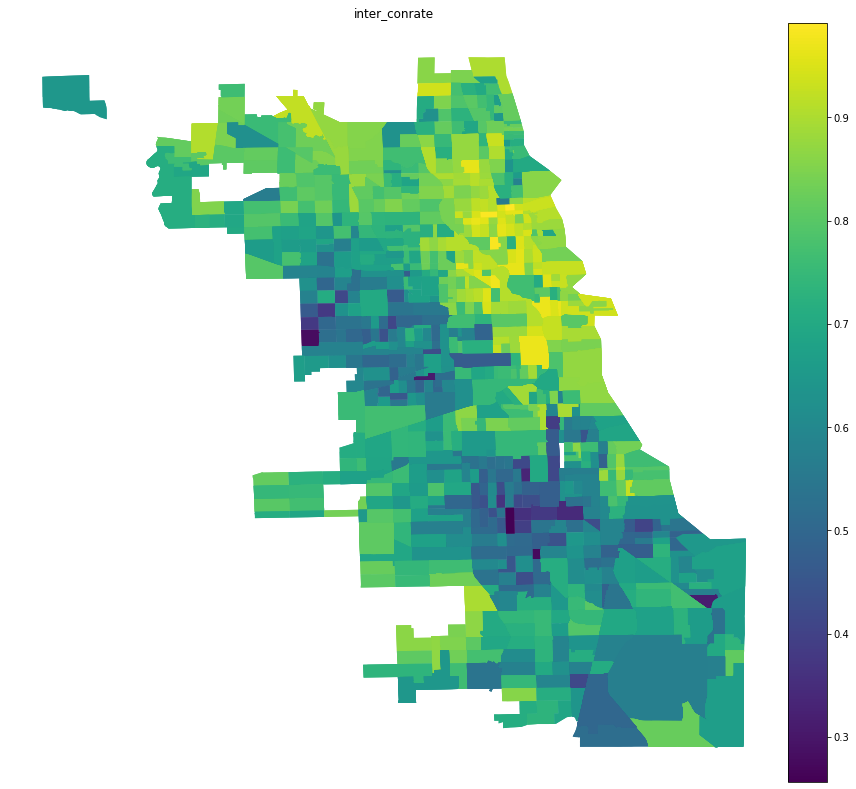

In [47]:
create_choropleth(chicago_2017,'inter_conrate', title1='inter_conrate')

In [79]:
def create_choropleth3(df1, column1, column2, column3, title1='title', title2='title', title3='title'):
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(13, 2))


    from mpl_toolkits.axes_grid1 import make_axes_locatable

    # first choropleth
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size='5%', pad=0.1)

    df1.plot(ax=ax1, column=column1, legend=True, cax=cax)
    ax1.axis('off')
    ax1.set_title(title1)
    # second choropleth
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes('right', size='5%', pad=0.1)

    df1.plot(ax=ax2, column=column2, legend=True, cax=cax)
    ax2.axis('off')
    ax2.set_title(title2)

    # third choropleth
    divider = make_axes_locatable(ax3)
    cax = divider.append_axes('right', size='5%', pad=0.1)

    df1.plot(ax=ax3, column=column3, legend=True, cax=cax)
    ax3.axis('off')
    ax3.set_title(title3)

    fig.tight_layout();


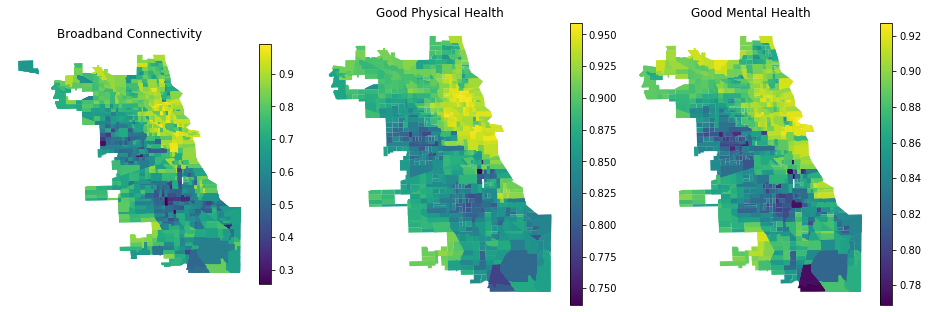

In [81]:
create_choropleth3(chicago_2017, 'inter_conrate', 'health_poorphys', 'health_poorment',
                   "Broadband Connectivity", "Good Physical Health", "Good Mental Health")

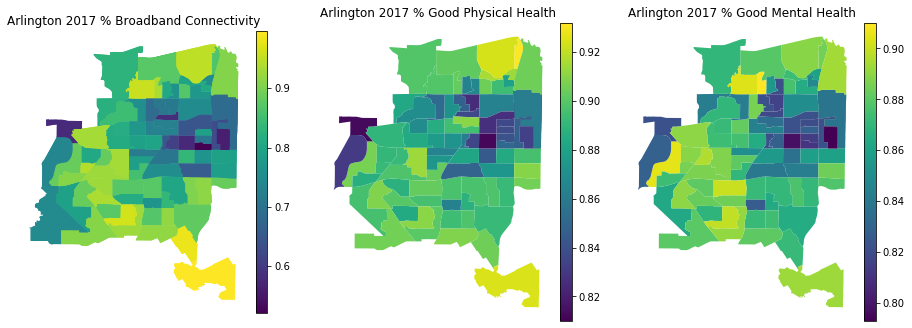

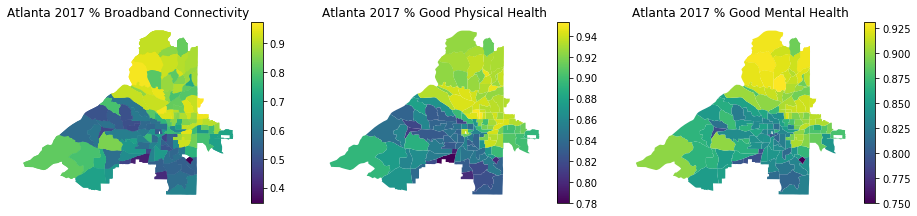

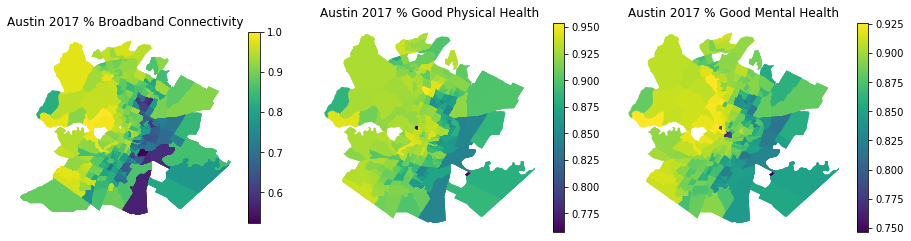

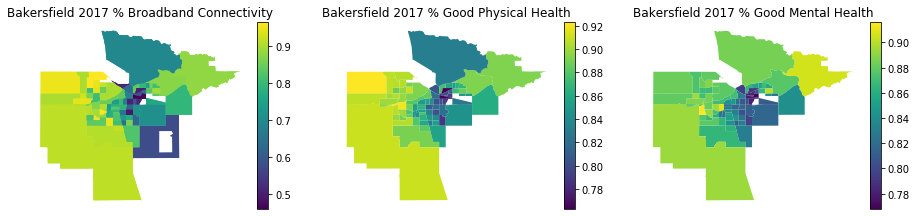

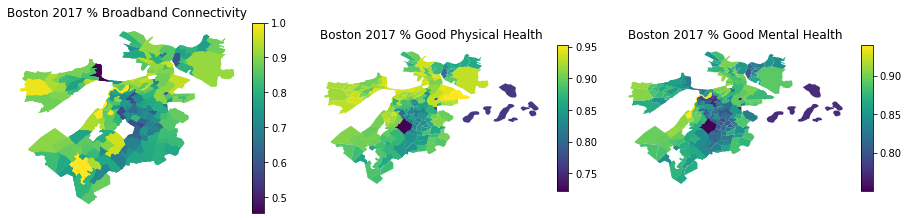

...

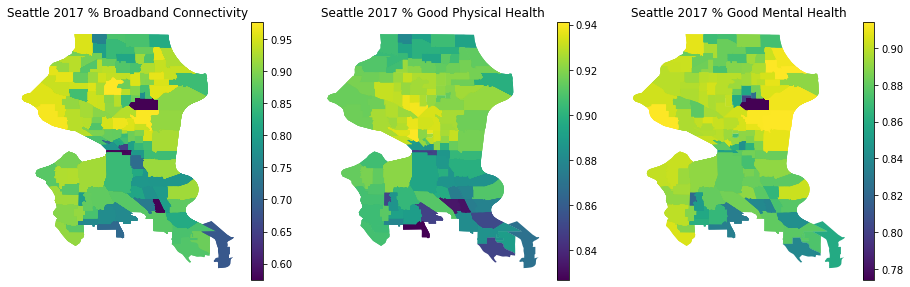

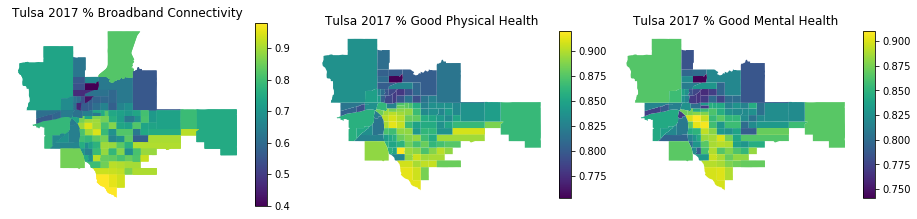

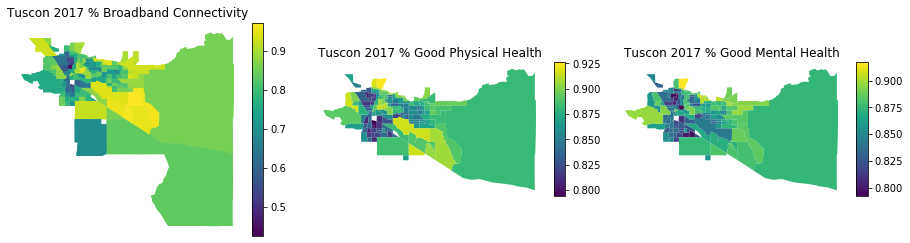

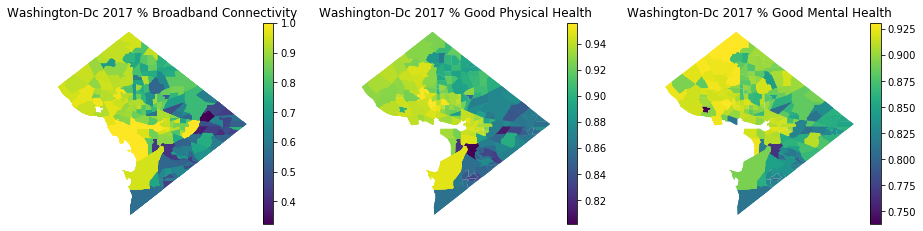

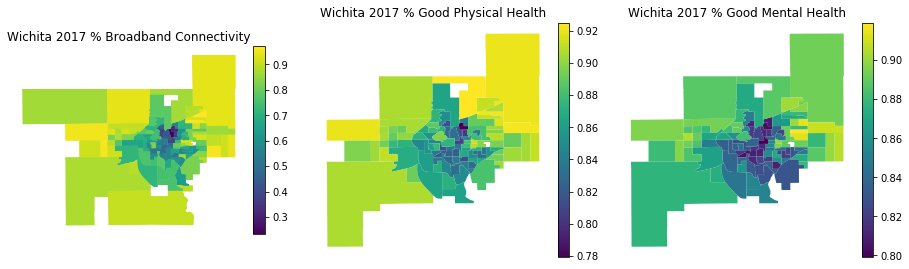

In [88]:
for city in sorted(set(gdf_2017['City'])):
    city_df = gdf_2017[gdf_2017['City'] == city]
    plot1 = create_choropleth3(city_df, 'inter_conrate', 'health_poorphys', 'health_poorment',
                             title1=f'{city.title()} 2017 % Broadband Connectivity',
                             title2=f'{city.title()} 2017 % Good Physical Health',
                             title3=f'{city.title()} 2017 % Good Mental Health')

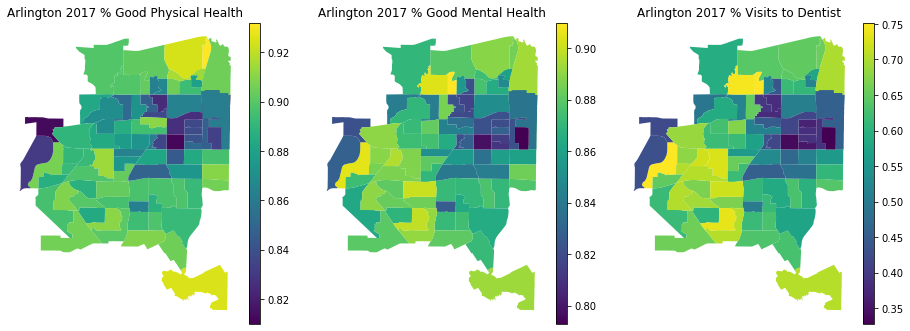

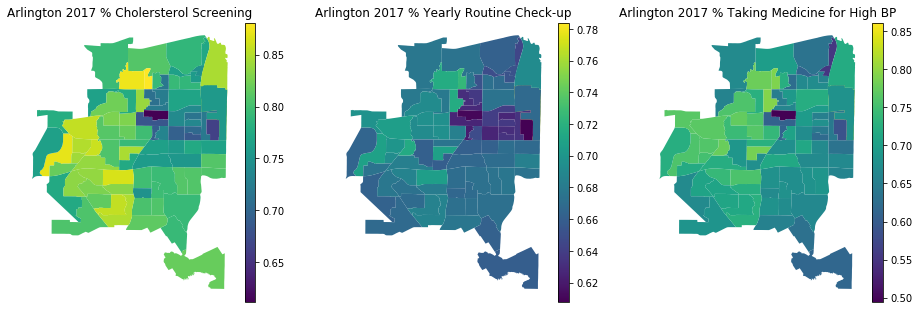

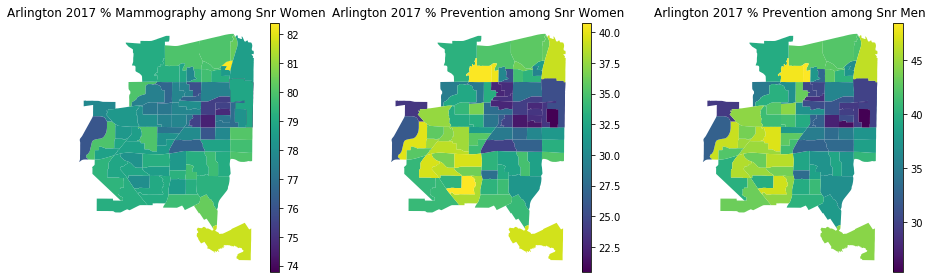

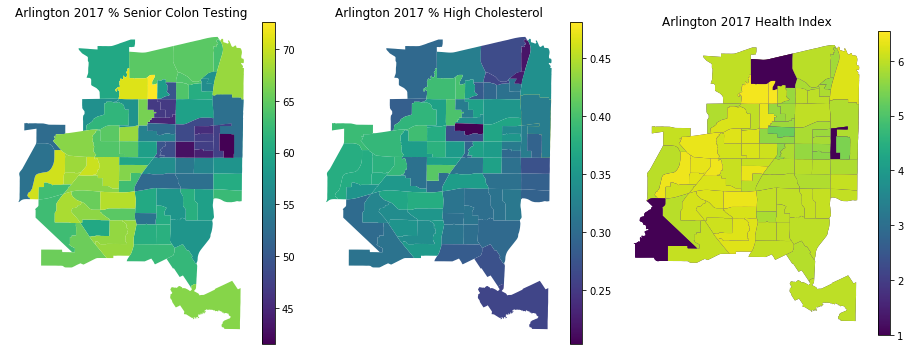

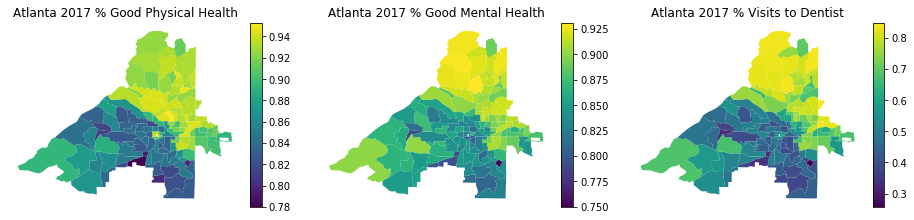

...

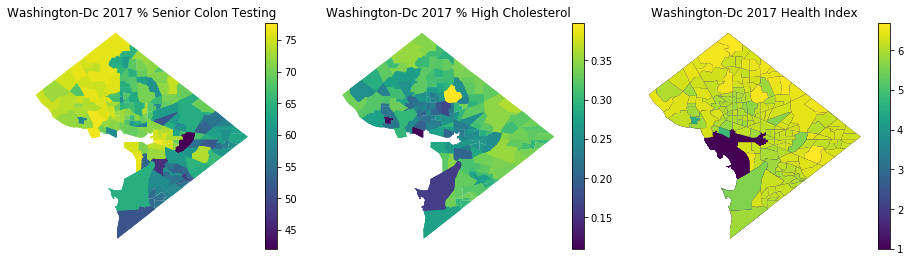

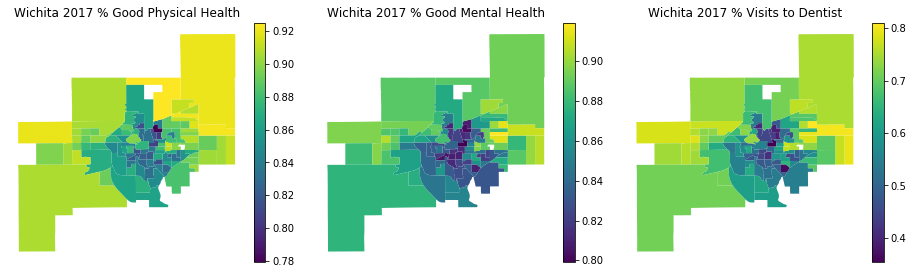

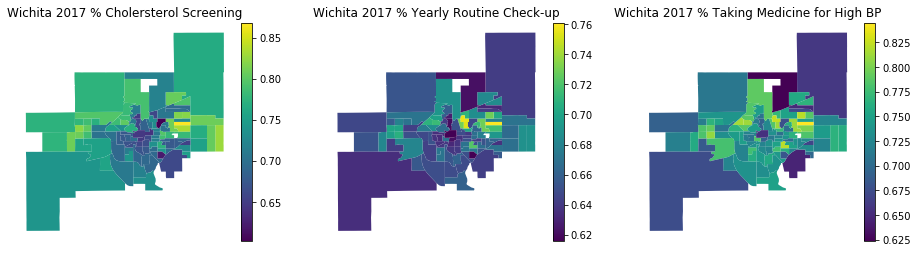

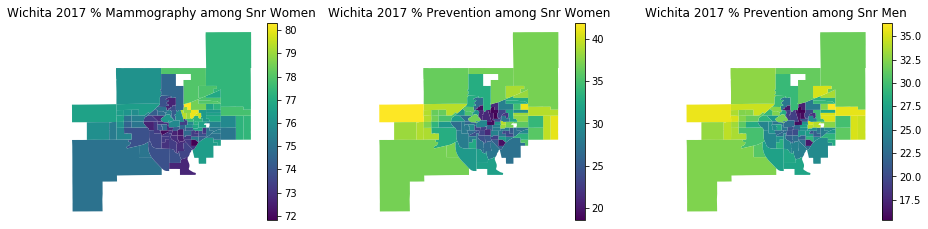

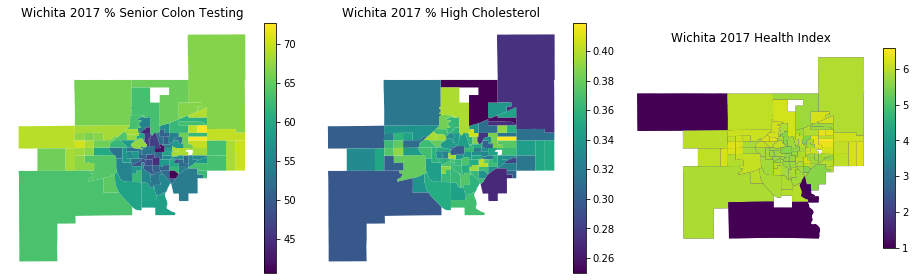

In [92]:
for city in sorted(set(gdf_2017['City'])):
    city_df = gdf_2017[gdf_2017['City'] == city]
    plot1 = create_choropleth3(city_df, 
                               'health_poorphys', 
                               'health_poorment', 
                               'health_dentvisits',
                             title1=f'{city.title()} 2017 % Good Physical Health',
                             title2=f'{city.title()} 2017 % Good Mental Health',
                             title3=f'{city.title()} 2017 % Visits to Dentist')
    
    plot2 = create_choropleth3(city_df, 
                               'health_cholscreen', 
                               'health_docvisits', 
                               'health_bloodmed',
                             title1=f'{city.title()} 2017 % Cholersterol Screening',
                             title2=f'{city.title()} 2017 % Yearly Routine Check-up',
                             title3=f'{city.title()} 2017 % Taking Medicine for High BP')
    
    plot3 = create_choropleth3(city_df, 
                               'Mammography use among women aged 50–74 Years', 
                               'health_prevserv', 
                               'Older adult men aged >=65 Years who are up to date on a core set of clinical preventive services: Flu shot past Year, PPV shot ever, Colorectal cancer screening',
                             title1=f'{city.title()} 2017 % Mammography among Snr Women',
                             title2=f'{city.title()} 2017 % Prevention among Snr Women',
                             title3=f'{city.title()} 2017 % Prevention among Snr Men')
    
    plot4 = create_choropleth3(city_df, 
                               'health_tests50_75', 
                               'health_cholhigh', 
                               'health_indx',
                             title1=f'{city.title()} 2017 % Senior Colon Testing',
                             title2=f'{city.title()} 2017 % High Cholesterol',
                             title3=f'{city.title()} 2017 Health Index')
